In [1]:
import torch
import torch.nn as nn
import torchaudio
import torchaudio.transforms as T
import torchvision.transforms as transforms
import torchaudio.functional as F
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import numpy as np
import random
from pydub import AudioSegment
from IPython.display import Audio
import torch_audiomentations as TA
import audiomentations as AA
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import fftconvolve
import IPython
import pyroomacoustics as pra

In [2]:
def _mix_down_if_necessary(signal):
    return torch.mean(signal, dim=0, keepdim=True) if signal.shape[0] > 1 else signal

# Load audio as tensor
waveform, sample_rate = torchaudio.load('data/lipsum.wav')
waveform = _mix_down_if_necessary(waveform)
waveform = waveform[:, 2000:]
print("Shape of waveform: {}".format(waveform.size()))
print("Sample rate of waveform: {}".format(sample_rate))
ipd.Audio(data=waveform, rate=sample_rate)

Shape of waveform: torch.Size([1, 264240])
Sample rate of waveform: 44100


In [3]:
# # Convert it to melspectrogram
spectrogram= T.MelSpectrogram(sample_rate=sample_rate,
                              n_fft=2560,
                              hop_length=512,
                              n_mels=256)(waveform)

# Convert it to spectrogram
#spectrogram = T.Spectrogram(n_fft=1024, hop_length=512)(waveform)

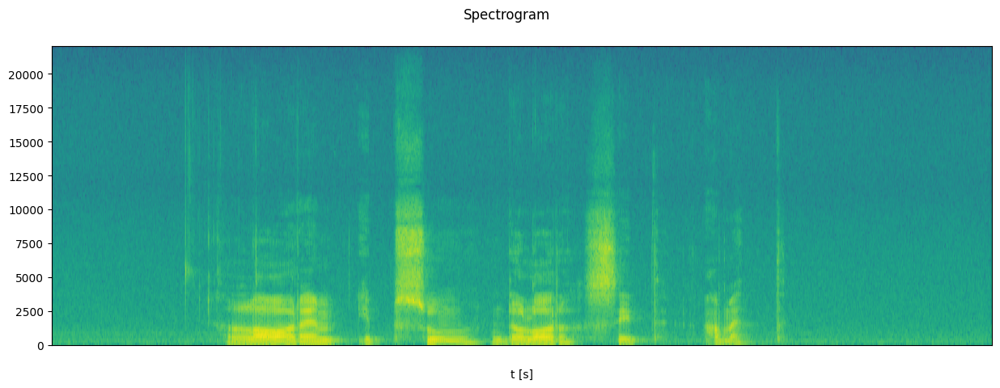

In [4]:
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
      axes = [axes]
    for c in range(num_channels):
      axes[c].specgram(waveform[c], Fs=sample_rate)
      if num_channels > 1:
        axes[c].set_ylabel(f'Channel {c+1}')
      if xlim:
        axes[c].set_xlim(xlim)

      axes[c].set_xlabel('t [s]')
      #change color
      axes[c].tick_params(axis='x', colors='white')
    figure.suptitle(title)
    figure.set_figwidth(15)
    plt.show(block=False)

plot_specgram(waveform, sample_rate)

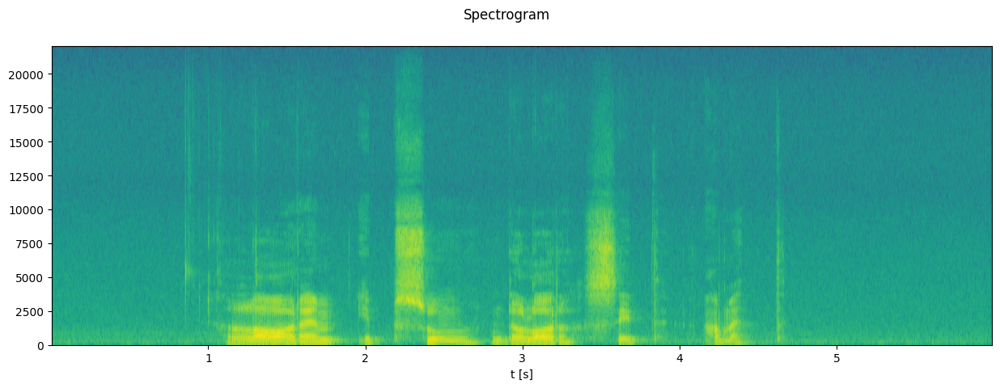

In [5]:
def plot_wav_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
      axes = [axes]
    for c in range(num_channels):
      axes[c].specgram(waveform[c], Fs=sample_rate, cmap='viridis')
      if num_channels > 1:
        axes[c].set_ylabel(f'Channel {c+1}')
      if xlim:
        axes[c].set_xlim(xlim)

      axes[c].set_xlabel('f [Hz]')
      axes[c].set_xlabel('t [s]')

    figure.suptitle(title)
    figure.set_figwidth(15)
    plt.show(block=False)

plot_wav_specgram(waveform, sample_rate)

# Plot functions definitions

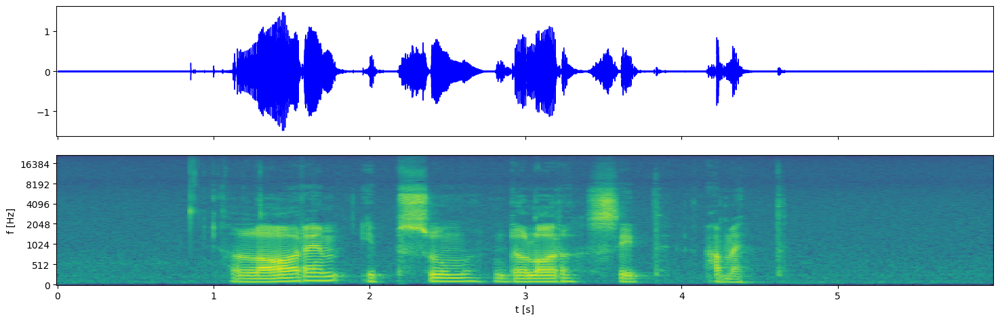

In [6]:
def plot_waveform_and_specgram(waveform, sample_rate, title="",cmap="viridis", save_as_pdf=False, save_name=None):
    fig, axes = plt.subplots(2, 1, figsize=(15, 5), sharex=True, tight_layout=True)
    # plot waveform
    plt.rcParams.update({'font.size': 15})
    # Check if waveform is <class 'numpy.ndarray'>
    if isinstance(waveform, np.ndarray):
        librosa.display.waveshow(waveform * 19, sr=sample_rate, ax=axes[0], color="blue")
        waveform = torch.Tensor(waveform)
    else:
        librosa.display.waveshow(waveform.numpy() * 10, sr=sample_rate, ax=axes[0], color="blue")
    # axes[0].set_ylim(-1.2, 1.2)
    axes[0].set_xlabel("")
    librosa.display.specshow(T.MelSpectrogram(n_fft=2350, hop_length=512, n_mels=512)(waveform[0]).log2().squeeze().detach().numpy(),
                            x_axis="time",
                            y_axis="mel",
                            n_fft=1024,
                            hop_length=512,
                            sr=sample_rate,
                            cmap=cmap,
                            ax=axes[1])
    axes[1].set_xlabel("t [s]")
    axes[1].set_ylabel("f [Hz]")
    if save_as_pdf:
        if title != "":
            plt.savefig(f"images/{title.replace(' ', '_')}.pdf", bbox_inches="tight")
        elif save_name is not None and title == "":
            plt.savefig(f"images/{save_name.replace(' ', '_')}.pdf", bbox_inches="tight")
    plt.show(block=False)
    plt.close()
    
plot_waveform_and_specgram(waveform, sample_rate, save_as_pdf=True, save_name="ukazka_waveform_mel_spektrogram")

# Waveform augmentation

## Volume modulation

In [7]:
volume_modulated_waveform = torchaudio.functional.gain(waveform, gain_db=10.0)

In [8]:
volume_modulated_waveform.shape

torch.Size([1, 264240])

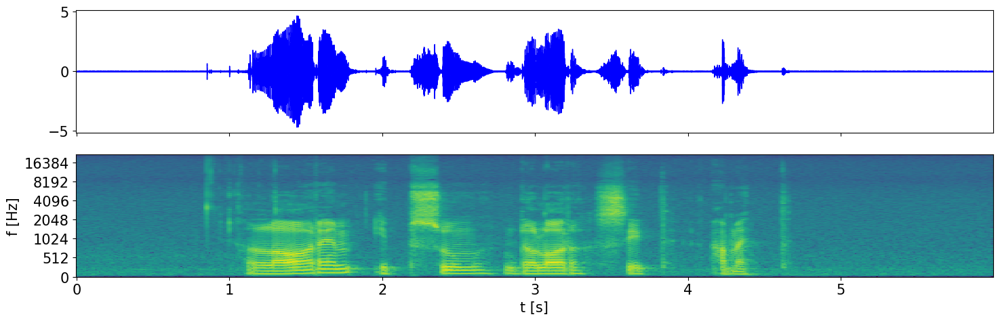

In [9]:
plot_waveform_and_specgram(volume_modulated_waveform, sample_rate, save_as_pdf=True, title="", save_name="Modulace hlasitosti - 10dB" )
torchaudio.save('augmented.wav', volume_modulated_waveform, sample_rate)

torch.Size([1, 264240])


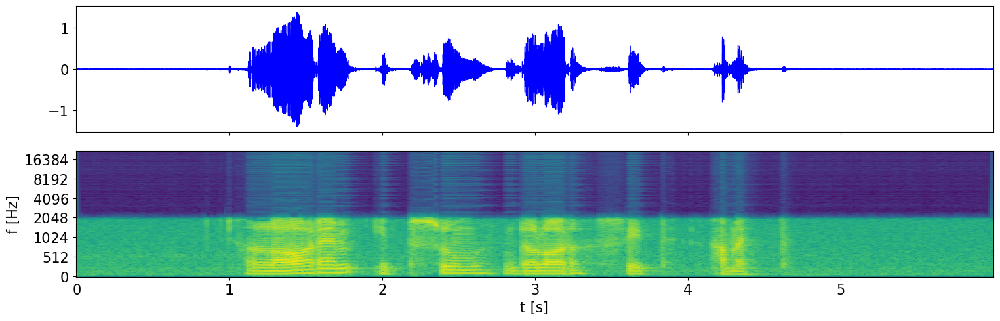

In [10]:
torch.manual_seed(0)
mp3 = AA.Compose([
    AA.Mp3Compression(min_bitrate=8, max_bitrate=8, p=1),
])
waveform_mp3= mp3(samples=waveform.unsqueeze(0).numpy(), sample_rate=sample_rate)
waveform_mp3 = torch.Tensor(waveform_mp3).unsqueeze(0)
print(waveform_mp3.shape)
plot_waveform_and_specgram(waveform_mp3, sample_rate, save_as_pdf=True, title="", save_name="MP3")

## Pitch shift

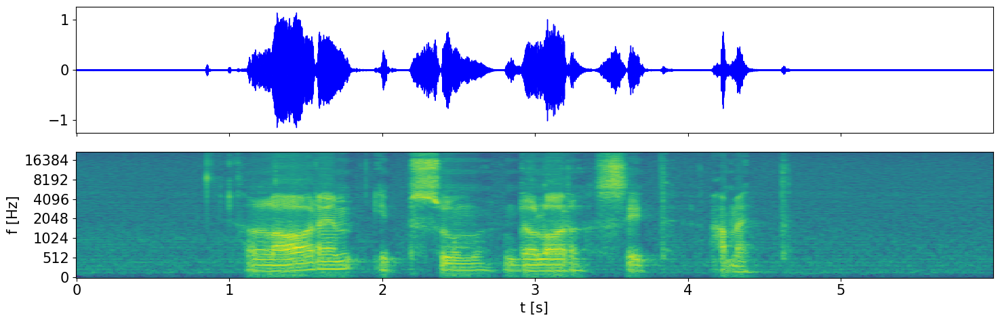

In [11]:
torch.manual_seed(0)
pitch_shift = TA.Compose([
    TA.PitchShift(min_transpose_semitones=0, max_transpose_semitones=16, p=1, sample_rate=sample_rate),
])
waveform_pitch_shifted = pitch_shift(samples=waveform.unsqueeze(0), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform_pitch_shifted.squeeze(0), sample_rate, save_as_pdf=True, title="", save_name="PitchShift")

## Noise addition

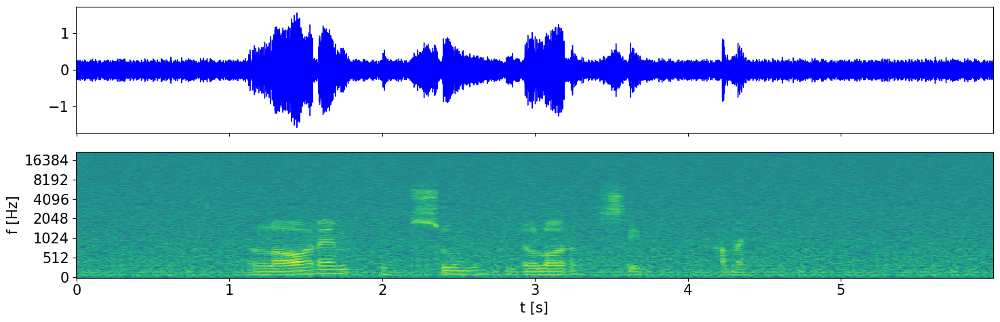

In [12]:
torch.manual_seed(7)
colored_noise = TA.Compose([
    TA.AddColoredNoise(min_snr_in_db=0, max_snr_in_db=20, p=1),
])
waveform_colored_noise = colored_noise(samples=waveform.unsqueeze(0), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform_colored_noise.squeeze(0), sample_rate, save_as_pdf=True, title="", save_name="ColoredNoise")

## Low shelf filter

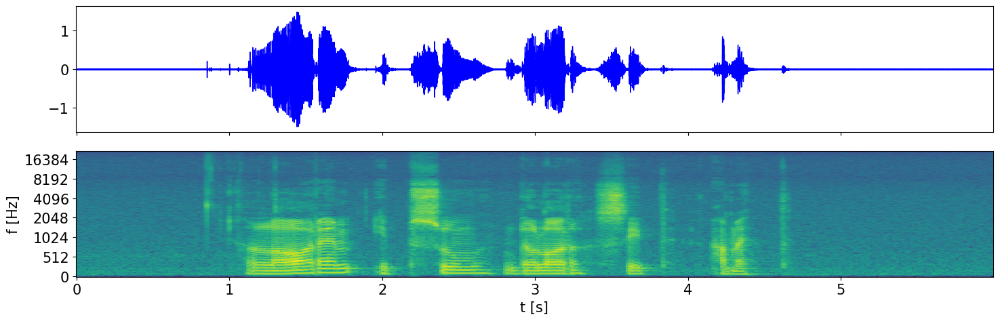

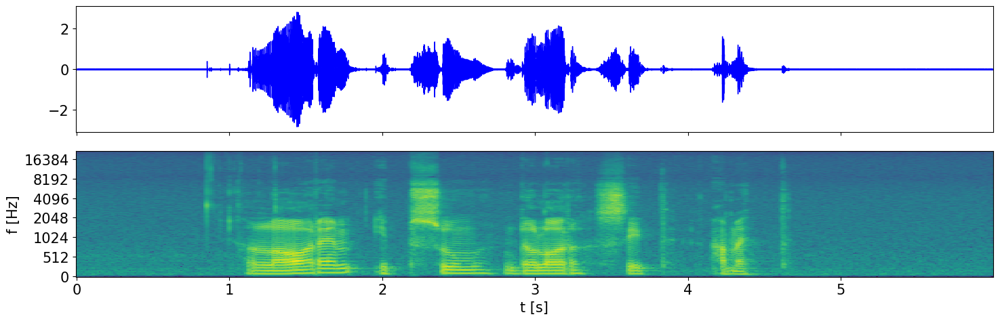

In [13]:
torch.manual_seed(7)

colored_noise = AA.Compose([
    AA.LowShelfFilter(min_center_freq=1000, max_center_freq=5000, min_gain_db=0.0, max_gain_db=0.1, min_q=0.9, max_q=1.0, p=1),
])
waveform_low_shelf_filter = colored_noise(samples=waveform.numpy(), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform, sample_rate, save_as_pdf=False, title="Original", save_name="LowShelfFilter")
plot_waveform_and_specgram(waveform_low_shelf_filter, sample_rate, save_as_pdf=False, title="", save_name="LowShelfFilter")
ipd.Audio(data=waveform_low_shelf_filter, rate=sample_rate)

## Low pass filter

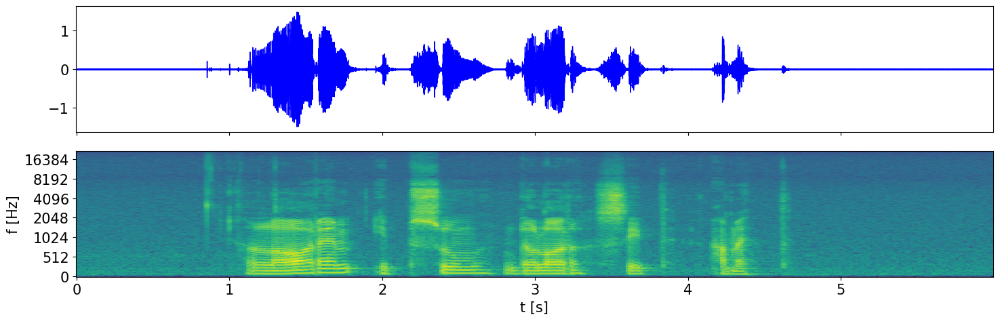

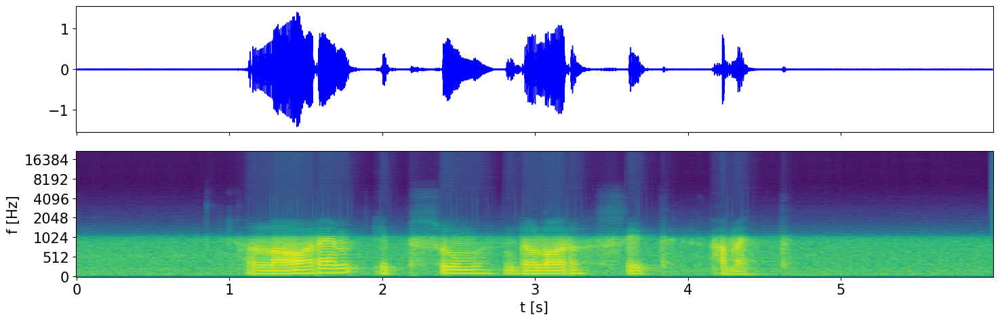

In [14]:
torch.manual_seed(7)

colored_noise = TA.Compose([
    TA.LowPassFilter(min_cutoff_freq=1599, max_cutoff_freq=1600, sample_rate=sample_rate, p=1),
])

waveform_low_pass_filter = colored_noise(samples=waveform.unsqueeze(0), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform, sample_rate, save_as_pdf=False, title="Original", save_name="LowPassFilter")
plot_waveform_and_specgram(waveform_low_pass_filter.squeeze(0), sample_rate, save_as_pdf=True, title="", save_name="LowPassFilter")
ipd.Audio(data=waveform_low_pass_filter.squeeze(0), rate=sample_rate)

## High pass filter

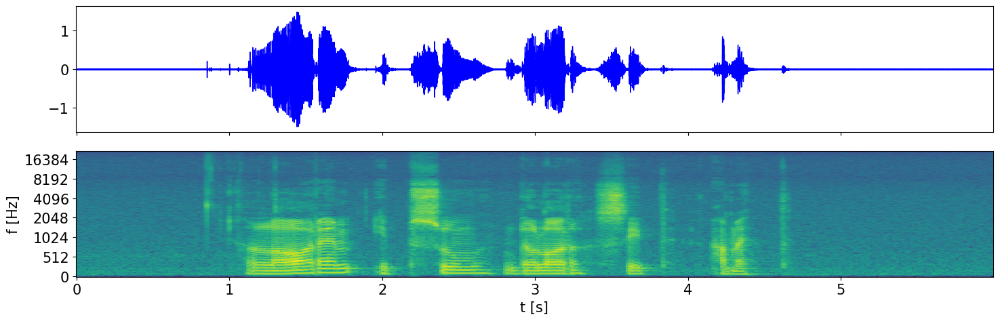

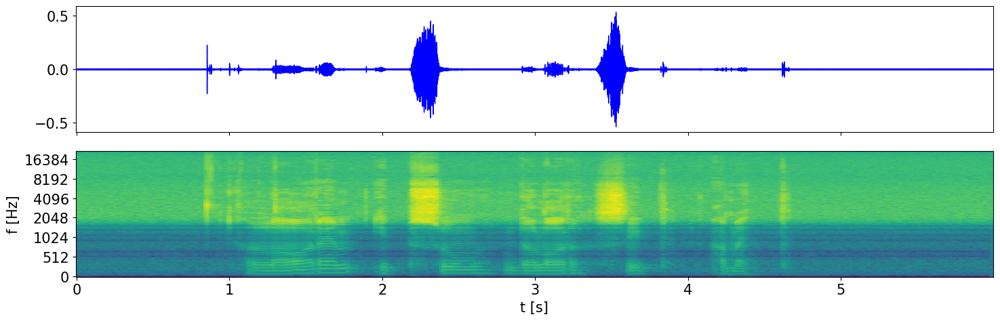

In [15]:
torch.manual_seed(7)

colored_noise = TA.Compose([
    TA.HighPassFilter(min_cutoff_freq=3500, max_cutoff_freq=3600, sample_rate=sample_rate, p=1),
])

waveform_high_pass_filter = colored_noise(samples=waveform.unsqueeze(0), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform, sample_rate, save_as_pdf=False, title="Original", save_name="HighPassFilter")
plot_waveform_and_specgram(waveform_high_pass_filter.squeeze(0), sample_rate, save_as_pdf=True, title="", save_name="HighPassFilter")
ipd.Audio(data=waveform_high_pass_filter.squeeze(0), rate=sample_rate)

## Band pass filter

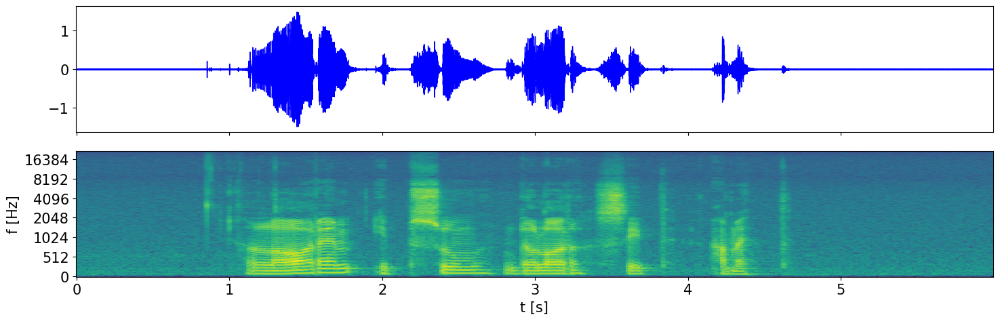

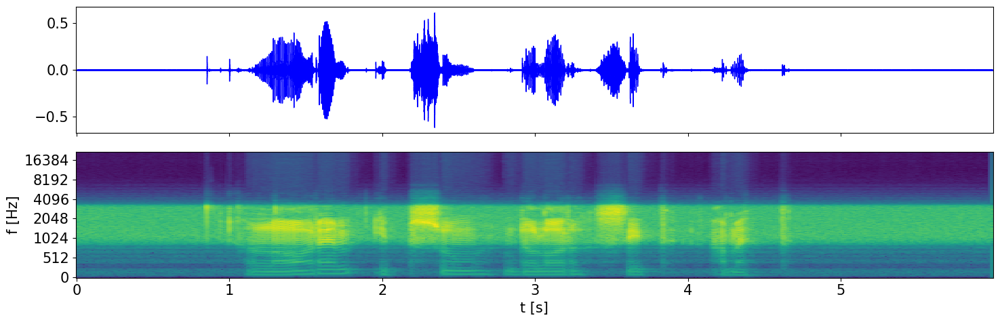

In [16]:
torch.manual_seed(7)

colored_noise = TA.Compose([
    TA.BandPassFilter(min_center_frequency=3500,
                      max_center_frequency=3600,
                      min_bandwidth_fraction=1.,
                      max_bandwidth_fraction=1.1,
                      sample_rate=sample_rate, 
                      p=1),
])

waveform_band_pass_filter = colored_noise(
    samples=waveform.unsqueeze(0), sample_rate=sample_rate)
plot_waveform_and_specgram(waveform, sample_rate, save_as_pdf=False, title="Original", save_name="BandPassFilter")
plot_waveform_and_specgram(waveform_band_pass_filter.squeeze(0), sample_rate, save_as_pdf=True, title="", save_name="BandPassFilter")
ipd.Audio(data=waveform_band_pass_filter.squeeze(0), rate=sample_rate)

## Room impulse response (RIR)

Original WAV:


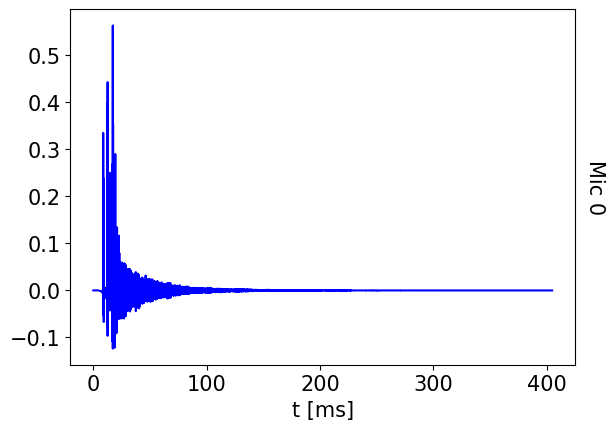

In [17]:
# Convolution with impulse response
#fs, signal = wavfile.read("/home/lvasina/Desktop/IBP/BP/image_generation/data/lipsum.wav")
signal, fs = librosa.load("/home/lvasina/Desktop/IBP/BP/image_generation/data/lipsum.wav", sr=44100)
corners = np.array([[0,0], [0,3], [5,3], [5,1], [3,1], [3,0]]).T  # [x,y]
# corners = np.array([[0,0], [0,35], [50,35], [50,10], [30,10], [30,0]]).T  # [x,y]

# set max_order to a low value for a quick (but less accurate) RIR
room = pra.Room.from_corners(corners, fs=fs, max_order=3, materials=pra.Material(0.2, 0.15), ray_tracing=True, air_absorption=True)
room.extrude(2., materials=pra.Material(0.2, 0.15))
# Set the ray tracing parameters
room.set_ray_tracing(receiver_radius=0.5, n_rays=10000, energy_thres=1e-5)
# add source and set the signal to WAV file content
source = room.add_source([1., 1., 0.5], signal=signal)
R = np.array([[3.5], [2.0], [0.5]])  # [[x], [y], [z]]
mic = room.add_microphone(R)
# compute image sources
room.image_source_model()
# Save the RIR to a WAV file

# # visualize 3D polyhedron room and image sources
# fig, ax = room.plot(img_order=1)
# fig.set_size_inches(18.5, 10.5)
fig, ax = room.plot_rir()
fig = plt.gcf()
ax = fig.gca()
ax.set_xlabel("t [ms]")
ax.set_title('')
plt.rcParams["figure.figsize"] = (15,8)
# set signal color
ax.lines[0].set_color('blue')
# Remove label from top x-axis
plt.savefig(f"images/RIR_signal.pdf", bbox_inches="tight")

# original signal
print("Original WAV:")
IPython.display.Audio(signal, rate=fs)

The RT60 is 260 ms


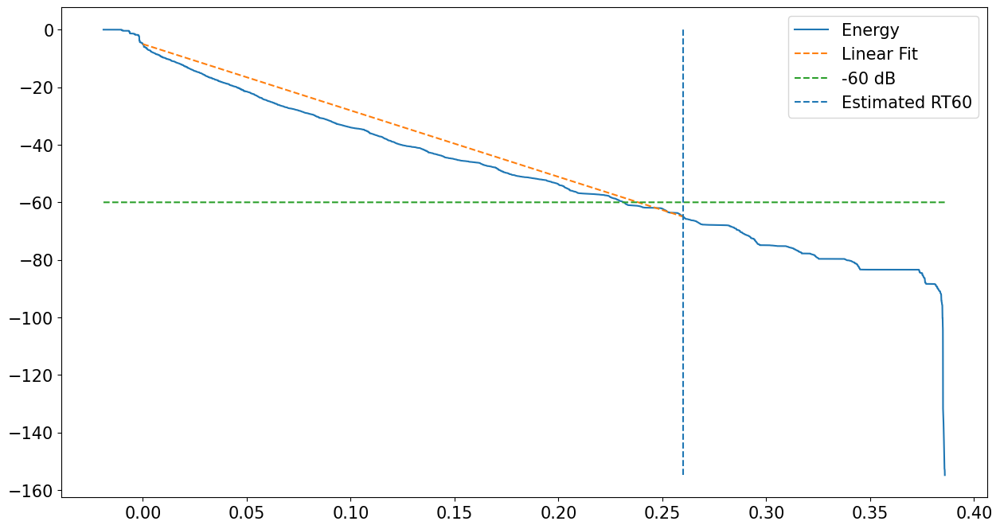

In [18]:
t60 = pra.experimental.measure_rt60(room.rir[0][0], fs=room.fs, plot=True)
print(f"The RT60 is {t60 * 1000:.0f} ms")

In [19]:
# Simulate convolution of signal wit RIR
room.simulate()
print(room.mic_array.signals.shape)
print(tuple(waveform.shape))
room.mic_array.signals = np.resize(room.mic_array.signals, tuple(waveform.shape))

(1, 284096)
(1, 264240)


In [20]:
print("Simulated propagation to the mic:")
print(room.mic_array.signals.shape, type(room.mic_array.signals))
IPython.display.Audio(room.mic_array.signals, rate=fs)

Simulated propagation to the mic:
(1, 264240) <class 'numpy.ndarray'>


In [21]:
print(waveform.shape, sample_rate, waveform.max(), waveform.min())
print(signal, fs, signal.max(), signal.min())

torch.Size([1, 264240]) 44100 tensor(0.1474) tensor(-0.1181)
[0. 0. 0. ... 0. 0. 0.] 44100 0.14743042 -0.118133545


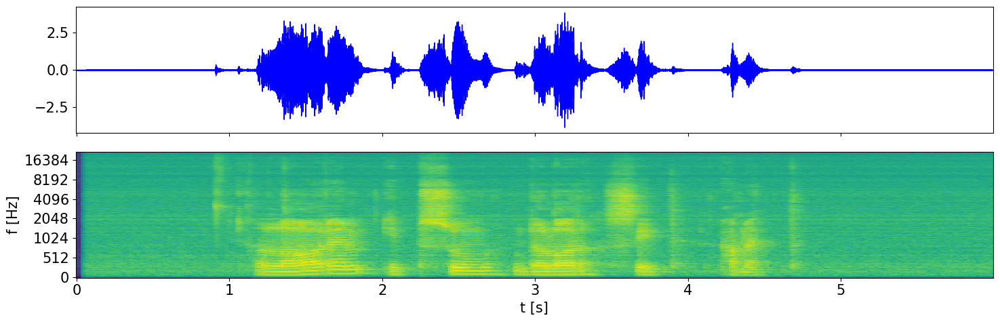

In [22]:

plot_waveform_and_specgram(room.mic_array.signals, fs, save_as_pdf=True, title="", save_name="RIR_Applied")

# Spectrogram augmentation

In [23]:
def plot_spectrogram(spectrogram, title, save_as_pdf=False, plot_colorbar=False, cmap="viridis", save_name=None):
    plt.figure(figsize=(15, 5))
    librosa.display.specshow((spectrogram+1e-9).log2().squeeze().detach().numpy(),
                            x_axis="time",
                            y_axis="mel",
                            n_fft=1024,
                            hop_length=512,
                            sr=sample_rate,
                            cmap=cmap,)
    if plot_colorbar:
        plt.colorbar()
    plt.title(title)
    plt.xlabel("t [s]")
    plt.ylabel("f [Hz]")
    if save_as_pdf:
        if title != "":
            plt.savefig(f"images/{title.replace(' ', '_')}.pdf", bbox_inches="tight")
        elif save_name is not None and title == "":
            plt.savefig(f"images/{save_name.replace(' ', '_')}.pdf", bbox_inches="tight")
    plt.show(block=False)
    plt.close()

In [24]:
def plot_multiple_spectrograms(spectrograms:list, titles:list, save_as_pdf=False, plot_colorbar=False, cmap="viridis", figsize=(15, 10), save_name=None):
    num_plots = len(spectrograms)
    fig, axes = plt.subplots(num_plots, 1, figsize=figsize, sharey=True, sharex=True)
    for i in range(num_plots):
        img = librosa.display.specshow((spectrograms[i]+1e-9).log2().squeeze().detach().numpy(),
                                x_axis="time",
                                y_axis="mel",
                                n_fft=1024,
                                hop_length=512,
                                sr=sample_rate,
                                cmap=cmap,
                                ax=axes[i])

        axes[i].set_title(titles[i])
        if i == num_plots // 2:
            axes[i].set_ylabel("f [Hz]")
        else:
            axes[i].set_ylabel("")
        if i == num_plots - 1:
            axes[i].set_xlabel("t [s]")
        else:
            axes[i].set_xlabel("")
        if plot_colorbar:
            fig.subplots_adjust(right=0.8)
            cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
            fig.colorbar(img, cax=cbar_ax)
    if save_as_pdf:
        plt.savefig(f"images/Mel_spektrogram_časově_roztažený.pdf", bbox_inches="tight")
    plt.show(block=False)
    plt.close()

## Time masking

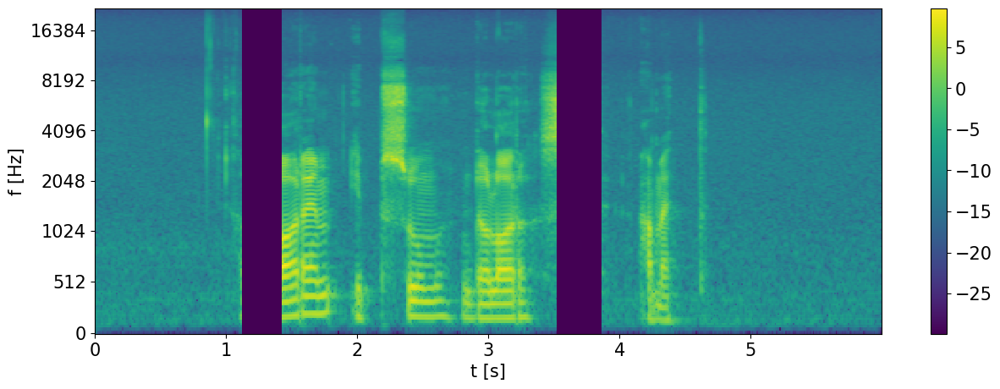

tensor([[[9.1194e-05, 4.3956e-05, 1.4958e-06,  ..., 9.7366e-07,
          2.2425e-07, 7.8253e-09],
         [3.5079e-04, 1.6908e-04, 5.7538e-06,  ..., 3.7453e-06,
          8.6259e-07, 3.0101e-08],
         [8.9993e-06, 2.4398e-04, 2.8119e-04,  ..., 1.5215e-05,
          3.1456e-06, 1.9279e-07],
         ...,
         [1.1315e-06, 1.3773e-06, 1.6473e-06,  ..., 2.0472e-06,
          2.3253e-06, 3.1961e-06],
         [6.2889e-07, 6.6522e-07, 8.2383e-07,  ..., 2.1141e-06,
          2.7768e-06, 4.5635e-06],
         [1.0520e-06, 8.7256e-07, 9.2084e-07,  ..., 2.5980e-06,
          1.9071e-06, 1.8241e-06]]])
tensor(0.)


In [25]:
torch.manual_seed(16)
time_masking = T.TimeMasking(time_mask_param=180)
time_masked_spec = time_masking(spectrogram)
torch.manual_seed(7)
time_masking = T.TimeMasking(time_mask_param=50)
time_masked_spec = time_masking(time_masked_spec)
plot_spectrogram(time_masked_spec, title="", save_as_pdf=True, cmap='viridis', plot_colorbar=True, save_name='Mel spektrogram s maskováním časové domény')
# print minimum value in a tensor
print(time_masked_spec)
print(time_masked_spec.min())


## Frequency masking

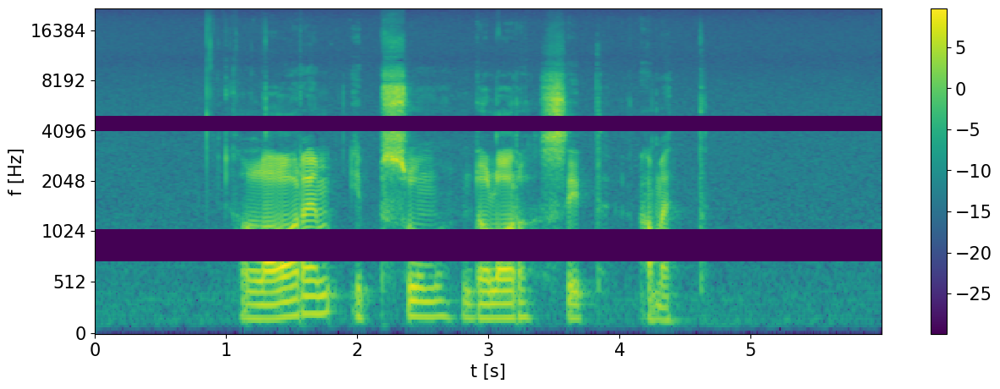

In [26]:
torch.manual_seed(16)
freq_masking = T.FrequencyMasking(freq_mask_param=80)
freq_masked_spec = freq_masking(spectrogram)
torch.manual_seed(7)
freq_masking = T.FrequencyMasking(freq_mask_param=40)
freq_masked_spec = freq_masking(freq_masked_spec)

plot_spectrogram(freq_masked_spec, title="", save_as_pdf=True, save_name='Mel spektrogram s maskováním frekvenční domény', plot_colorbar=True)

## Time stretch

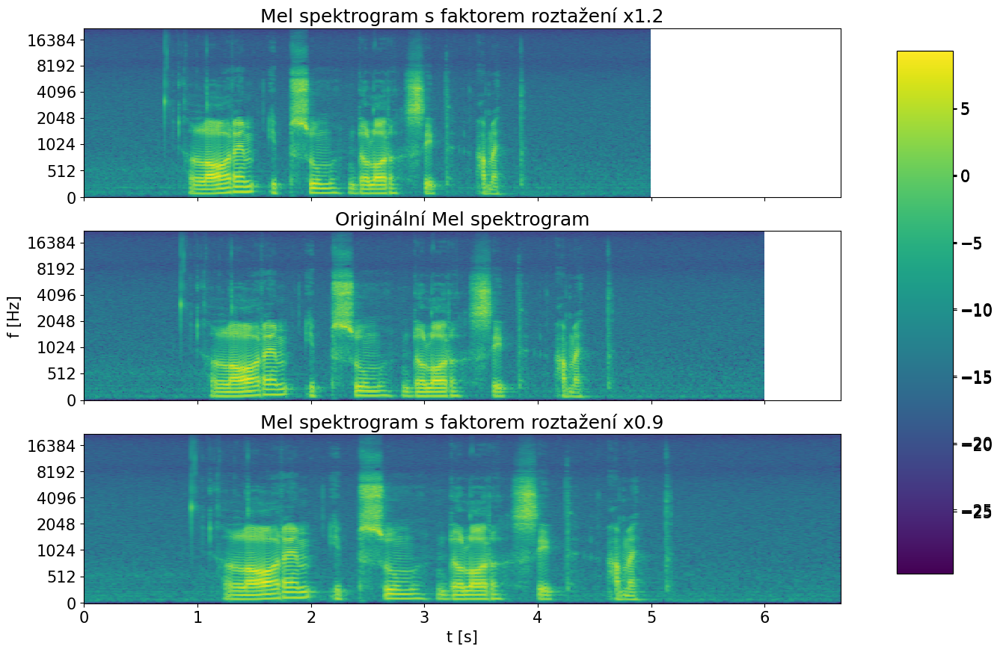

In [27]:
spec = T.MelSpectrogram(n_fft=2350, hop_length=512, n_mels=513)(waveform)
stretch = T.TimeStretch(n_freq=513, hop_length=512)

spec_12 = np.abs(stretch(spec, overriding_rate=1.2))
orig_spec = np.abs(stretch(spec, overriding_rate=1))
spec_09 = np.abs(stretch(spec, overriding_rate=0.9))
plot_multiple_spectrograms([spec_12, orig_spec, spec_09], titles=["Mel spektrogram s faktorem roztažení x1.2", "Originální Mel spektrogram", "Mel spektrogram s faktorem roztažení x0.9"], figsize=(15, 10), save_as_pdf=True, plot_colorbar=True)

In [28]:
import torch
import torch.nn.functional as F
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Load an audio file
audio_file = 'data/lipsum.wav'
y, sr = librosa.load(audio_file, sr=None)

# Compute the mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr)


# Define a warping factor (1.0 means no warping)
warp_factor = 1.5

# Create a new time axis
new_time = torch.arange(0, mel_spectrogram.shape[1] * warp_factor, step=warp_factor)

# Custom warping function
def warp_spectrogram(spec, new_time):
    num_bins, num_frames = spec.shape
    indices = torch.floor(new_time).long()
    frac = new_time - indices.float()
    indices = torch.clamp(indices, 0, num_frames-2)

    left_spec = spec[:, indices]
    right_spec = spec[:, indices + 1]

    warped_spec = (1 - frac) * left_spec + frac * right_spec

    return warped_spec


# Define the region of interest (ROI)
roi_start = 0  # Adjust this value to determine the start of the ROI
roi_end = 1   # Adjust this value to determine the end of the ROI

# Create a mask to identify the ROI
roi_mask = (new_time >= roi_start) & (new_time <= roi_end)
#print(roi_mask)
# Apply warping only to the ROI
def warp_spectrogram2(spec, new_time, roi_mask):
    num_bins, num_frames = spec.shape
    indices = torch.floor(new_time).long()
    frac = new_time - indices.float()
    indices = torch.clamp(indices, 0, num_frames-2)

    left_spec = spec[:, indices]
    right_spec = spec[:, indices + 1]

    warped_spec = (1 - frac) * left_spec + frac * right_spec

    # Apply the warping only to the ROI
    warped_spec[:, roi_mask] = spec[:, roi_mask]

    return warped_spec


# Apply time warping
#warped_mel_spectrogram = warp_spectrogram(torch.tensor(mel_spectrogram), new_time)
warped_mel_spectrogram = warp_spectrogram2(torch.tensor(mel_spectrogram), new_time, roi_mask)


# Display the original and warped spectrograms
plt.figure(figsize=(10, 4))
plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Mel Spectrogram')

plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.power_to_db(warped_mel_spectrogram.numpy(), ref=np.max), y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Warped Mel Spectrogram')

plt.tight_layout()
plt.show()


TypeError: melspectrogram() takes 0 positional arguments but 1 positional argument (and 1 keyword-only argument) were given

In [ ]:
import torch
import torch.nn.functional as F
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Load an audio file
audio_file = 'data/lipsum.wav'
y, sr = librosa.load(audio_file, sr=None)

# Compute the mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr)

# Define a warping factor (1.0 means no warping)
warp_factor = 1.2

# Create a new time axis
new_time = torch.arange(0, mel_spectrogram.shape[1] * warp_factor, step=warp_factor)

# Normalize new_time to range [0, 1]
new_time = new_time / (mel_spectrogram.shape[1] - 1)

# Create a grid of coordinates
grid = torch.stack((torch.zeros_like(new_time), new_time), dim=1).unsqueeze(0)

# Reshape mel spectrogram for grid_sample
mel_spectrogram = mel_spectrogram[None, None]

# Apply grid_sample for time warping
warped_mel_spectrogram = F.grid_sample(mel_spectrogram, grid)

# Display the original and warped spectrograms
plt.figure(figsize=(10, 4))
plt.subplot(2, 1, 1)
librosa.display.specshow(librosa.power_to_db(mel_spectrogram[0, 0].numpy(), ref=np.max), y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Mel Spectrogram')

plt.subplot(2, 1, 2)
librosa.display.specshow(librosa.power_to_db(warped_mel_spectrogram[0, 0].detach().numpy(), ref=np.max), y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Warped Mel Spectrogram')

plt.tight_layout()
plt.show()


TypeError: melspectrogram() takes 0 positional arguments but 1 positional argument (and 1 keyword-only argument) were given